In [81]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


In [82]:
df=pd.read_csv("train.csv")

In [83]:
df.shape

(404290, 6)

In [84]:
df.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


In [85]:
 df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            404290 non-null  int64 
 1   qid1          404290 non-null  int64 
 2   qid2          404290 non-null  int64 
 3   question1     404289 non-null  object
 4   question2     404288 non-null  object
 5   is_duplicate  404290 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


In [86]:
df.isnull().sum()

id              0
qid1            0
qid2            0
question1       1
question2       2
is_duplicate    0
dtype: int64

In [87]:
df.dropna(inplace=True)

In [88]:
df.duplicated().sum()

0

In [89]:
print(df["is_duplicate"].value_counts())
print((df["is_duplicate"].value_counts()/df["is_duplicate"].count())*100)
df["is_duplicate"].value_counts().plot(kind="bar")

0    255024
1    149263
Name: is_duplicate, dtype: int64
0    63.079941
1    36.920059
Name: is_duplicate, dtype: float64


<AxesSubplot:>

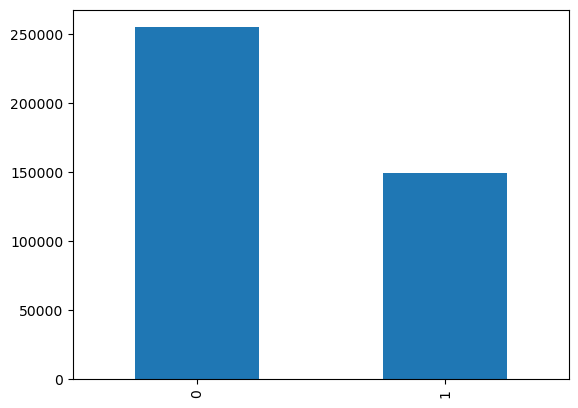

In [90]:
plt.show()

In [91]:
# repeated question
qid=pd.Series(df["qid1"].tolist()+df["qid2"].tolist())

In [92]:
print("Number of unique question",np.unique(qid).shape[0])

Number of unique question 537929


In [93]:
x=qid.value_counts()>1

In [94]:
print("Number of repeated question",x[x].shape[0])

Number of repeated question 111778


In [95]:
plt.hist(qid.value_counts().values,bins=160)
plt.yscale("log")

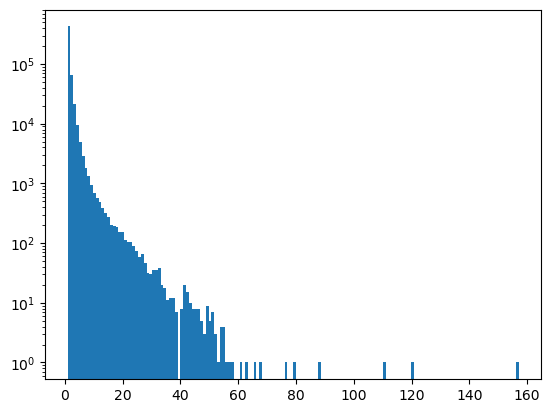

In [96]:
plt.show()

In [97]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sna

In [98]:
new_df=df.sample(50000)

In [99]:
new_df.isnull().sum()

id              0
qid1            0
qid2            0
question1       0
question2       0
is_duplicate    0
dtype: int64

In [100]:
new_df.duplicated().sum()

0

In [101]:
ques_df=new_df[["question1","question2"]]
ques_df.head()

,question1,question2
261615,What is the worst drug and why?,What is the worst drug to be addicted to?
266040,Where do we come from?,Where did we come from?
355341,How do I keep my boyfriend sexually satisfied?,How do I satisfy my penis? I at times keep on ...
300542,How may I know whether my wife is cheating on me?,How do I know whether a guy is cheating on me ...
168091,What type of curve described is by the polar e...,WHAT DO YOU UNDERSTAND BY TERM BUSINESS?


In [102]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer(max_features=3000)

In [103]:
question=list(ques_df["question1"])+list(ques_df["question2"])

In [104]:
len(question)

100000

In [105]:
q1_arr,q2_arr=np.vsplit(cv.fit_transform(question).toarray(),2)

In [106]:
temp_df1=pd.DataFrame(q1_arr,index=ques_df.index)
temp_df2=pd.DataFrame(q2_arr,index=ques_df.index)

In [107]:

temp_df=pd.concat([temp_df1,temp_df2],axis=1)

In [108]:
temp_df.shape

(50000, 6000)

In [109]:
temp_df["is_duplicate"]=new_df["is_duplicate"]

In [110]:
temp_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2991,2992,2993,2994,2995,2996,2997,2998,2999,is_duplicate
261615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
266040,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
355341,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
300542,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
168091,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [111]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(temp_df.iloc[:,0:-1].values,temp_df.iloc[:,-1].values,test_size=0.2,random_state=5)

In [112]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [113]:
# rf=RandomForestClassifier()
# rf.fit(x_train,y_train)
# y_pred=rf.predict(x_test)
# accuracy_score(y_test,y_pred)

In [114]:
!pip install xgboost

In [115]:
# from xgboost import XGBClassifier
# xgb=XGBClassifier()
# xgb.fit(x_train,y_train)
# y_pred=xgb.predict(x_test)
# accuracy_score(y_test,y_pred)

In [116]:
# feature engiinering
# q1 len,q2 len ,words_total,word_share

In [117]:
new_df["q1_len"]=new_df["question1"].str.len()
new_df["q2_len"]=new_df["question2"].str.len()

In [118]:

new_df["q1_num_word"]=new_df["question1"].apply(lambda row:len(row.split(" ")))
new_df["q2_num_word"]=new_df["question2"].apply(lambda row:len(row.split(" ")))

In [119]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word
261615,261615,244260,377799,What is the worst drug and why?,What is the worst drug to be addicted to?,0,31,41,7,9
266040,266040,383142,240331,Where do we come from?,Where did we come from?,1,22,23,5,5
355341,355341,484564,484565,How do I keep my boyfriend sexually satisfied?,How do I satisfy my penis? I at times keep on ...,0,46,146,8,29
300542,300542,72639,19115,How may I know whether my wife is cheating on me?,How do I know whether a guy is cheating on me ...,1,49,52,11,13
168091,168091,260451,260452,What type of curve described is by the polar e...,WHAT DO YOU UNDERSTAND BY TERM BUSINESS?,0,64,40,14,7


In [120]:
def common_word(row):
    w1=set(map(lambda word:word.lower(),row["question1"].split(" ")))
    w2=set(map(lambda word:word.lower(),row["question2"].split(" ")))
    return len(w1 & w2)

In [121]:
new_df["word_common"]=new_df.apply(common_word,axis=1)

In [122]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,word_common
261615,261615,244260,377799,What is the worst drug and why?,What is the worst drug to be addicted to?,0,31,41,7,9,5
266040,266040,383142,240331,Where do we come from?,Where did we come from?,1,22,23,5,5,4
355341,355341,484564,484565,How do I keep my boyfriend sexually satisfied?,How do I satisfy my penis? I at times keep on ...,0,46,146,8,29,5
300542,300542,72639,19115,How may I know whether my wife is cheating on me?,How do I know whether a guy is cheating on me ...,1,49,52,11,13,7
168091,168091,260451,260452,What type of curve described is by the polar e...,WHAT DO YOU UNDERSTAND BY TERM BUSINESS?,0,64,40,14,7,2


In [123]:
def total_words(row):
    w1=set(map(lambda word:word.lower().strip(),row["question1"].split()))
    w2=set(map(lambda word:word.lower().strip(),row["question2"].split()))
    return (len(w1)+len(w2))

In [124]:
new_df['word_total']=new_df.apply(total_words,axis=1)

In [125]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,word_common,word_total
261615,261615,244260,377799,What is the worst drug and why?,What is the worst drug to be addicted to?,0,31,41,7,9,5,16
266040,266040,383142,240331,Where do we come from?,Where did we come from?,1,22,23,5,5,4,10
355341,355341,484564,484565,How do I keep my boyfriend sexually satisfied?,How do I satisfy my penis? I at times keep on ...,0,46,146,8,29,5,31
300542,300542,72639,19115,How may I know whether my wife is cheating on me?,How do I know whether a guy is cheating on me ...,1,49,52,11,13,7,24
168091,168091,260451,260452,What type of curve described is by the polar e...,WHAT DO YOU UNDERSTAND BY TERM BUSINESS?,0,64,40,14,7,2,21


In [126]:
new_df["word_share"]=round(new_df["word_common"]/new_df["word_total"],3)

In [127]:
new_df

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,word_common,word_total,word_share
261615,261615,244260,377799,What is the worst drug and why?,What is the worst drug to be addicted to?,0,31,41,7,9,5,16,0.312
266040,266040,383142,240331,Where do we come from?,Where did we come from?,1,22,23,5,5,4,10,0.400
355341,355341,484564,484565,How do I keep my boyfriend sexually satisfied?,How do I satisfy my penis? I at times keep on ...,0,46,146,8,29,5,31,0.161
300542,300542,72639,19115,How may I know whether my wife is cheating on me?,How do I know whether a guy is cheating on me ...,1,49,52,11,13,7,24,0.292
168091,168091,260451,260452,What type of curve described is by the polar e...,WHAT DO YOU UNDERSTAND BY TERM BUSINESS?,0,64,40,14,7,2,21,0.095
...,...,...,...,...,...,...,...,...,...,...,...,...,...
53948,53948,95285,95286,What is life after 40?,What is the correlation between excellence in ...,0,22,82,5,13,2,18,0.111
102680,102680,169860,169861,What are some things that monkeys like to do?,What are some things monkeys do all day?,0,45,40,9,8,5,17,0.294
372332,372332,231922,483307,What were the causes and effects of the Boxer ...,What was the purpose of the Chinese Boxer Rebe...,1,92,89,17,16,7,28,0.250
283616,283616,403745,403746,Being a non resident in USA How much tax do I ...,If I get 60000$ in USA how much should I pay tax?,1,86,49,21,12,7,31,0.226


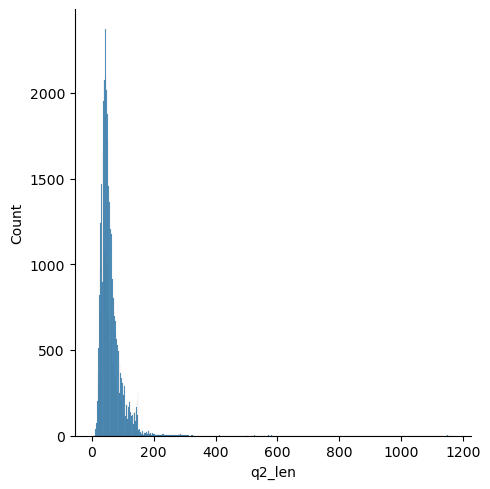

minimum character 3
max character 1169
average character 60.09472


In [128]:
sns.displot(new_df["q2_len"])
plt.show()
print("minimum character",new_df["q2_len"].min())
print("max character",new_df["q2_len"].max())
print("average character",new_df["q2_len"].mean())

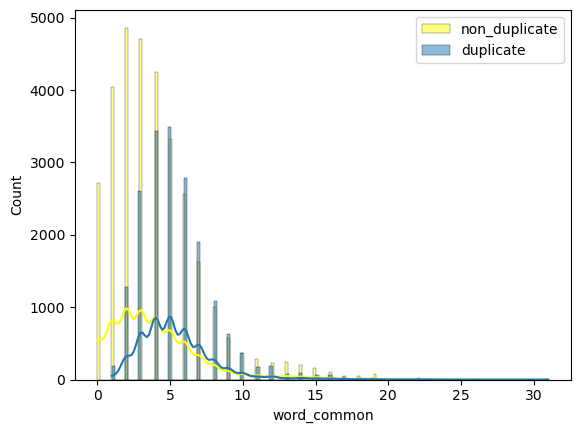

In [129]:
# common word
sns.histplot(new_df[new_df["is_duplicate"]==0]["word_common"],label="non_duplicate",kde=True,color="yellow")
sns.histplot(new_df[new_df["is_duplicate"]==1]["word_common"],label="duplicate",kde=True)
plt.legend()
plt.show()

In [130]:
t_df=new_df.drop(columns=["id","qid1","qid2","question1","question2","is_duplicate"])
print(t_df.shape)

(50000, 7)


In [131]:
t_df.head()

,q1_len,q2_len,q1_num_word,q2_num_word,word_common,word_total,word_share
261615,31,41,7,9,5,16,0.312
266040,22,23,5,5,4,10,0.400
355341,46,146,8,29,5,31,0.161
300542,49,52,11,13,7,24,0.292
168091,64,40,14,7,2,21,0.095


In [132]:
final_df=pd.concat([t_df,temp_df],axis=1)

In [133]:
print(final_df.shape)
final_df.head()

(50000, 6008)


,q1_len,q2_len,q1_num_word,q2_num_word,word_common,word_total,word_share,0,1,2,...,2991,2992,2993,2994,2995,2996,2997,2998,2999,is_duplicate
261615,31,41,7,9,5,16,0.312,0,0,0,...,0,0,0,0,0,0,0,0,0,0
266040,22,23,5,5,4,10,0.400,0,0,0,...,0,0,0,0,0,0,0,0,0,1
355341,46,146,8,29,5,31,0.161,0,0,0,...,0,0,0,0,0,0,0,0,0,0
300542,49,52,11,13,7,24,0.292,0,0,0,...,0,0,0,0,0,0,0,0,0,1
168091,64,40,14,7,2,21,0.095,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [134]:
temp_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2991,2992,2993,2994,2995,2996,2997,2998,2999,is_duplicate
261615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
266040,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
355341,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
300542,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
168091,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [135]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(final_df.iloc[:,:-1].values,final_df.iloc[:,-1].values,test_size=.2,random_state=5)

In [136]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
rf=RandomForestClassifier()

In [137]:
# rf.fit(x_train,y_train)
# y_pred=rf.predict(x_test)
# accuracy_score(y_test,y_pred)

In [138]:
# from xgboost import XGBClassifier
# xgb=XGBClassifier()
# xgb.fit(x_train,y_train)
# y_pred=xgb.predict(x_test)

In [139]:
# accuracy_score(y_test,y_pred)

In [140]:
import re
from bs4 import BeautifulSoup

In [141]:
def preprocess(q):
    
    q = str(q).lower().strip()
    
    # Replace certain special characters with their string equivalents
    q = q.replace('%', ' percent')
    q = q.replace('$', ' dollar ')
    q = q.replace('₹', ' rupee ')
    q = q.replace('€', ' euro ')
    q = q.replace('@', ' at ')
    
    # The pattern '[math]' appears around 900 times in the whole dataset.
    q = q.replace('[math]', '')
    
    # Replacing some numbers with string equivalents (not perfect, can be done better to account for more cases)
    q = q.replace(',000,000,000 ', 'b ')
    q = q.replace(',000,000 ', 'm ')
    q = q.replace(',000 ', 'k ')
    q = re.sub(r'([0-9]+)000000000', r'\1b', q)
    q = re.sub(r'([0-9]+)000000', r'\1m', q)
    q = re.sub(r'([0-9]+)000', r'\1k', q)
    
    # Decontracting words
    # https://en.wikipedia.org/wiki/Wikipedia%3aList_of_English_contractions
    # https://stackoverflow.com/a/19794953
    contractions = { 
    "ain't": "am not",
    "aren't": "are not",
    "can't": "can not",
    "can't've": "can not have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he would",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "i'd": "i would",
    "i'd've": "i would have",
    "i'll": "i will",
    "i'll've": "i will have",
    "i'm": "i am",
    "i've": "i have",
    "isn't": "is not",
    "it'd": "it would",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "it will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she would",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so as",
    "that'd": "that would",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there would",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they would",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we would",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you would",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
    }

    q_decontracted = []

    for word in q.split():
        if word in contractions:
            word = contractions[word]

        q_decontracted.append(word)

    q = ' '.join(q_decontracted)
    q = q.replace("'ve", " have")
    q = q.replace("n't", " not")
    q = q.replace("'re", " are")
    q = q.replace("'ll", " will")
    
    # Removing HTML tags
    q = BeautifulSoup(q)
    q = q.get_text()
    
    # Remove punctuations
    pattern = re.compile('\W')
    q = re.sub(pattern, ' ', q).strip()

    
    return q

In [142]:
new_df["question1"]=new_df["question1"].apply(preprocess)
new_df["question2"]=new_df["question2"].apply(preprocess)

In [143]:
new_df['q1_len'] = new_df['question1'].str.len() 
new_df['q2_len'] = new_df['question2'].str.len()

In [144]:
new_df['q1_num_words'] = new_df['question1'].apply(lambda row: len(row.split(" ")))
new_df['q2_num_words'] = new_df['question2'].apply(lambda row: len(row.split(" ")))
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,word_common,word_total,word_share,q1_num_words,q2_num_words
261615,261615,244260,377799,what is the worst drug and why,what is the worst drug to be addicted to,0,30,40,7,9,5,16,0.312,7,9
266040,266040,383142,240331,where do we come from,where did we come from,1,21,22,5,5,4,10,0.400,5,5
355341,355341,484564,484565,how do i keep my boyfriend sexually satisfied,how do i satisfy my penis i at times keep on ...,0,45,145,8,29,5,31,0.161,8,32
300542,300542,72639,19115,how may i know whether my wife is cheating on me,how do i know whether a guy is cheating on me ...,1,48,51,11,13,7,24,0.292,11,13
168091,168091,260451,260452,what type of curve described is by the polar e...,what do you understand by term business,0,63,39,14,7,2,21,0.095,15,7


In [145]:
def common_words(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return len(w1 & w2)

In [146]:
new_df['word_common'] = new_df.apply(common_words, axis=1)
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,word_common,word_total,word_share,q1_num_words,q2_num_words
261615,261615,244260,377799,what is the worst drug and why,what is the worst drug to be addicted to,0,30,40,7,9,5,16,0.312,7,9
266040,266040,383142,240331,where do we come from,where did we come from,1,21,22,5,5,4,10,0.400,5,5
355341,355341,484564,484565,how do i keep my boyfriend sexually satisfied,how do i satisfy my penis i at times keep on ...,0,45,145,8,29,5,31,0.161,8,32
300542,300542,72639,19115,how may i know whether my wife is cheating on me,how do i know whether a guy is cheating on me ...,1,48,51,11,13,8,24,0.292,11,13
168091,168091,260451,260452,what type of curve described is by the polar e...,what do you understand by term business,0,63,39,14,7,2,21,0.095,15,7


In [147]:
def total_words(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return (len(w1) + len(w2))

In [148]:
new_df['word_total'] = new_df.apply(total_words, axis=1)
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,word_common,word_total,word_share,q1_num_words,q2_num_words
261615,261615,244260,377799,what is the worst drug and why,what is the worst drug to be addicted to,0,30,40,7,9,5,15,0.312,7,9
266040,266040,383142,240331,where do we come from,where did we come from,1,21,22,5,5,4,10,0.400,5,5
355341,355341,484564,484565,how do i keep my boyfriend sexually satisfied,how do i satisfy my penis i at times keep on ...,0,45,145,8,29,5,32,0.161,8,32
300542,300542,72639,19115,how may i know whether my wife is cheating on me,how do i know whether a guy is cheating on me ...,1,48,51,11,13,8,24,0.292,11,13
168091,168091,260451,260452,what type of curve described is by the polar e...,what do you understand by term business,0,63,39,14,7,2,21,0.095,15,7


In [149]:
new_df['word_share'] = round(new_df['word_common']/new_df['word_total'],2)
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,word_common,word_total,word_share,q1_num_words,q2_num_words
261615,261615,244260,377799,what is the worst drug and why,what is the worst drug to be addicted to,0,30,40,7,9,5,15,0.33,7,9
266040,266040,383142,240331,where do we come from,where did we come from,1,21,22,5,5,4,10,0.40,5,5
355341,355341,484564,484565,how do i keep my boyfriend sexually satisfied,how do i satisfy my penis i at times keep on ...,0,45,145,8,29,5,32,0.16,8,32
300542,300542,72639,19115,how may i know whether my wife is cheating on me,how do i know whether a guy is cheating on me ...,1,48,51,11,13,8,24,0.33,11,13
168091,168091,260451,260452,what type of curve described is by the polar e...,what do you understand by term business,0,63,39,14,7,2,21,0.10,15,7


In [152]:
from nltk.corpus import stopwords

def fetch_token_features(row):
    
    q1 = row['question1']
    q2 = row['question2']
    
    SAFE_DIV = 0.0001 

    STOP_WORDS = stopwords.words("english")
    
    token_features = [0.0]*8
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    return token_features
token_features = new_df.apply(fetch_token_features, axis=1)

new_df["cwc_min"]       = list(map(lambda x: x[0], token_features))
new_df["cwc_max"]       = list(map(lambda x: x[1], token_features))
new_df["csc_min"]       = list(map(lambda x: x[2], token_features))
new_df["csc_max"]       = list(map(lambda x: x[3], token_features))
new_df["ctc_min"]       = list(map(lambda x: x[4], token_features))
new_df["ctc_max"]       = list(map(lambda x: x[5], token_features))
new_df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
new_df["first_word_eq"] = list(map(lambda x: x[7], token_features))

In [153]:
preprocess("I am enthusiast about machine learning")

'i am enthusiast about machine learning'

In [154]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,...,q1_num_words,q2_num_words,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq
261615,261615,244260,377799,what is the worst drug and why,what is the worst drug to be addicted to,0,30,40,7,9,...,7,9,0.999950,0.666644,0.599988,0.599988,0.714276,0.555549,0.0,1.0
266040,266040,383142,240331,where do we come from,where did we come from,1,21,22,5,5,...,5,5,0.999900,0.999900,0.749981,0.749981,0.799984,0.799984,1.0,1.0
355341,355341,484564,484565,how do i keep my boyfriend sexually satisfied,how do i satisfy my penis i at times keep on ...,0,45,145,8,29,...,8,32,0.249994,0.076922,0.999975,0.399996,0.624992,0.172413,0.0,1.0
300542,300542,72639,19115,how may i know whether my wife is cheating on me,how do i know whether a guy is cheating on me ...,1,48,51,11,13,...,11,13,0.749981,0.599988,0.833319,0.555549,0.727266,0.615380,0.0,1.0
168091,168091,260451,260452,what type of curve described is by the polar e...,what do you understand by term business,0,63,39,14,7,...,15,7,0.000000,0.000000,0.499988,0.399992,0.285710,0.153845,0.0,1.0


In [155]:
import distance

def fetch_length_features(row):
    
    q1 = row['question1']
    q2 = row['question2']
    
    length_features = [0.0]*3
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return length_features
    
    # Absolute length features
    length_features[0] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    length_features[1] = (len(q1_tokens) + len(q2_tokens))/2
    
    strs = list(distance.lcsubstrings(q1, q2))
    length_features[2] = len(strs[0]) / (min(len(q1), len(q2)) + 1)
    
    return length_features

In [156]:
length_features = new_df.apply(fetch_length_features, axis=1)

new_df['abs_len_diff'] = list(map(lambda x: x[0], length_features))
new_df['mean_len'] = list(map(lambda x: x[1], length_features))
new_df['longest_substr_ratio'] = list(map(lambda x: x[2], length_features))

In [157]:
!pip install fuzzywuzzy 

In [158]:
# Fuzzy Features
from fuzzywuzzy import fuzz

def fetch_fuzzy_features(row):
    
    q1 = row['question1']
    q2 = row['question2']
    
    fuzzy_features = [0.0]*4
    
    # fuzz_ratio
    fuzzy_features[0] = fuzz.QRatio(q1, q2)

    # fuzz_partial_ratio
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)

    # token_sort_ratio
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)

    # token_set_ratio
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)

    return fuzzy_features

C:\Users\AMIT PAREEK\anaconda3\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [159]:
fuzzy_features = new_df.apply(fetch_fuzzy_features, axis=1)

In [160]:

# Creating new feature columns for fuzzy features
new_df['fuzz_ratio'] = list(map(lambda x: x[0], fuzzy_features))
new_df['fuzz_partial_ratio'] = list(map(lambda x: x[1], fuzzy_features))
new_df['token_sort_ratio'] = list(map(lambda x: x[2], fuzzy_features))
new_df['token_set_ratio'] = list(map(lambda x: x[3], fuzzy_features))

In [161]:
print(new_df.shape)
new_df.head()

(50000, 30)


,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
261615,261615,244260,377799,what is the worst drug and why,what is the worst drug to be addicted to,0,30,40,7,9,...,0.555549,0.0,1.0,2.0,8.0,0.741935,74,80,71,85
266040,266040,383142,240331,where do we come from,where did we come from,1,21,22,5,5,...,0.799984,1.0,1.0,0.0,5.0,0.590909,93,90,93,93
355341,355341,484564,484565,how do i keep my boyfriend sexually satisfied,how do i satisfy my penis i at times keep on ...,0,45,145,8,29,...,0.172413,0.0,1.0,21.0,18.5,0.195652,32,49,36,52
300542,300542,72639,19115,how may i know whether my wife is cheating on me,how do i know whether a guy is cheating on me ...,1,48,51,11,13,...,0.615380,0.0,1.0,2.0,12.0,0.367347,79,81,75,86
168091,168091,260451,260452,what type of curve described is by the polar e...,what do you understand by term business,0,63,39,14,7,...,0.153845,0.0,1.0,6.0,10.0,0.125000,39,51,34,38


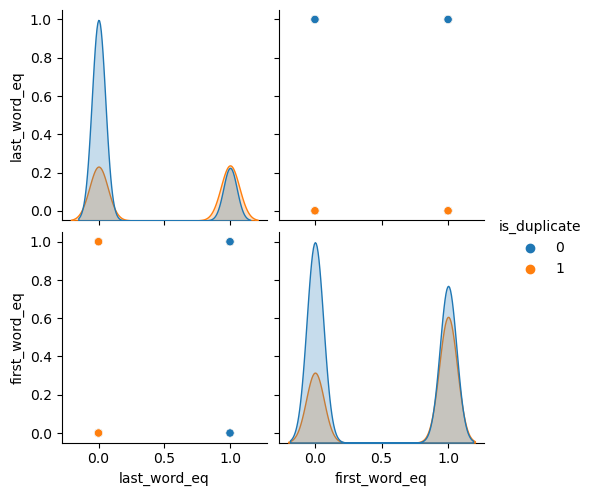

In [162]:
sns.pairplot(new_df[['last_word_eq', 'first_word_eq', 'is_duplicate']],hue='is_duplicate')
plt.show()

In [163]:
sns.pairplot(new_df[['fuzz_ratio', 'fuzz_partial_ratio','token_sort_ratio','token_set_ratio', 'is_duplicate']],hue='is_duplicate')

In [164]:
sns.pairplot(new_df[['ctc_min', 'cwc_min', 'csc_min', 'is_duplicate']],hue='is_duplicate')

In [165]:
sns.pairplot(new_df[['mean_len', 'abs_len_diff','longest_substr_ratio', 'is_duplicate']],hue='is_duplicate')

In [166]:
sns.pairplot(new_df[['ctc_max', 'cwc_max', 'csc_max', 'is_duplicate']],hue='is_duplicate')

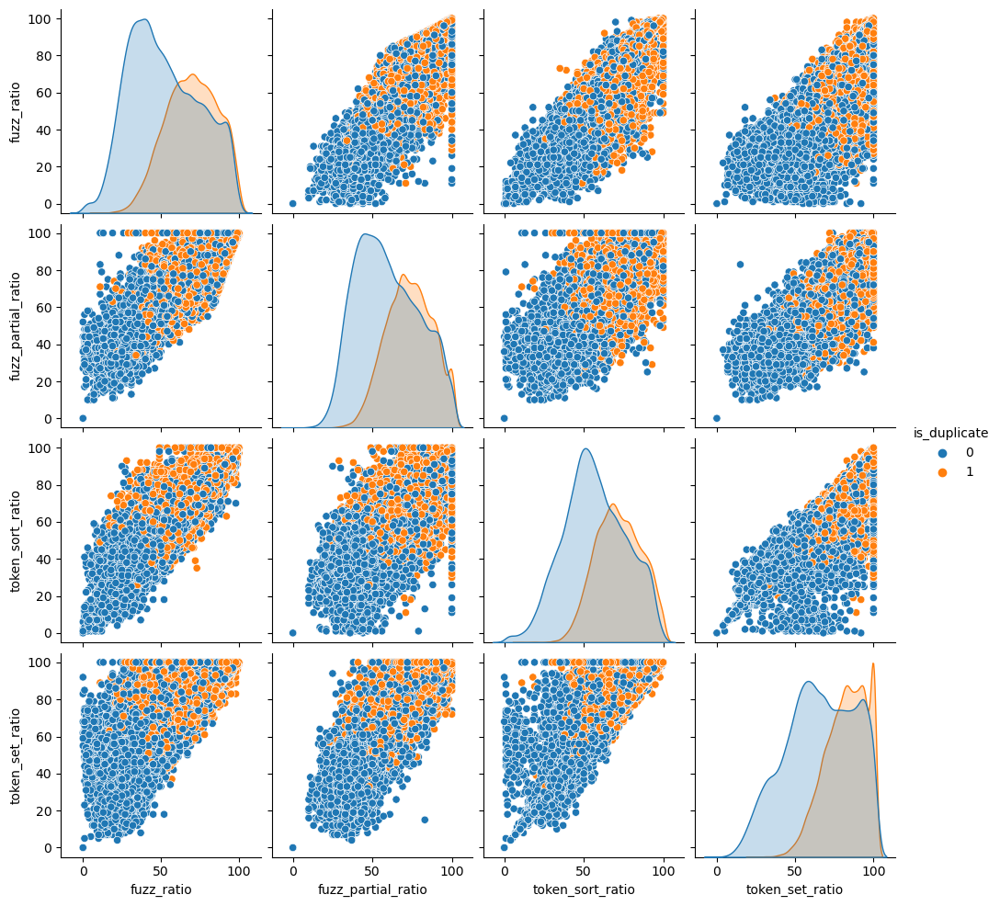

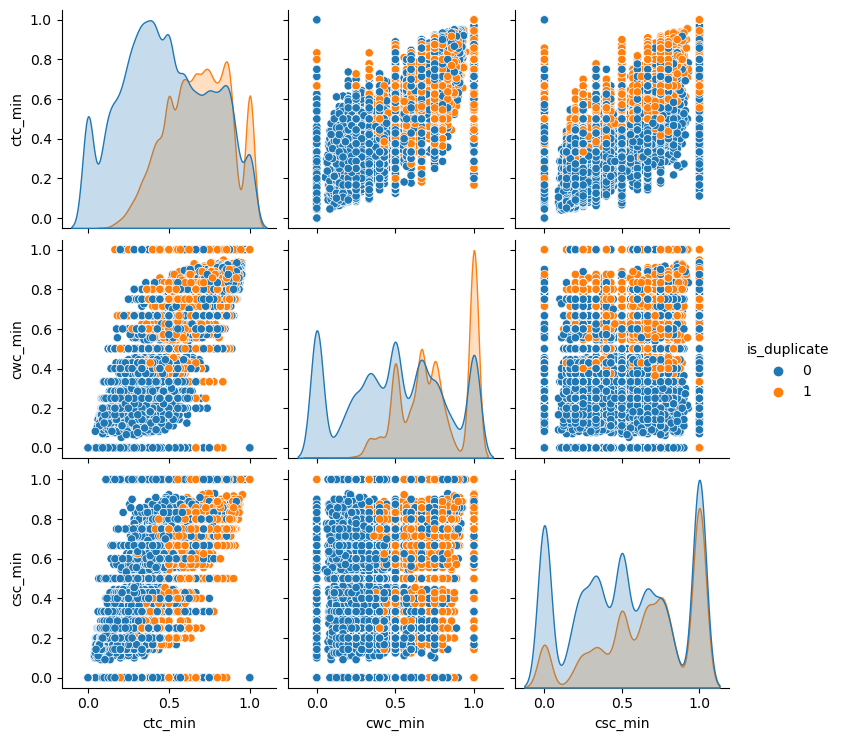

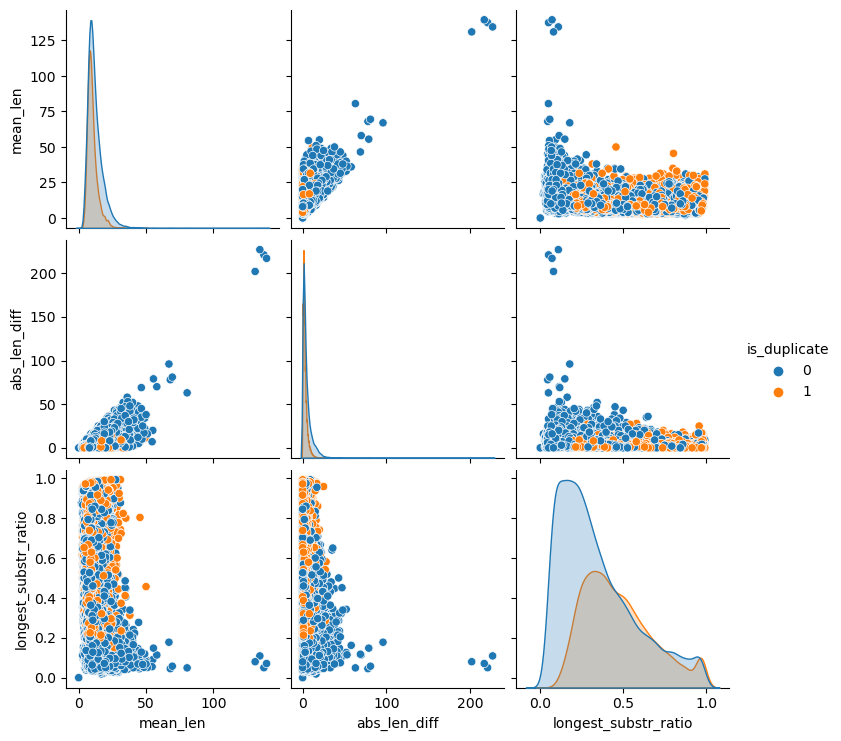

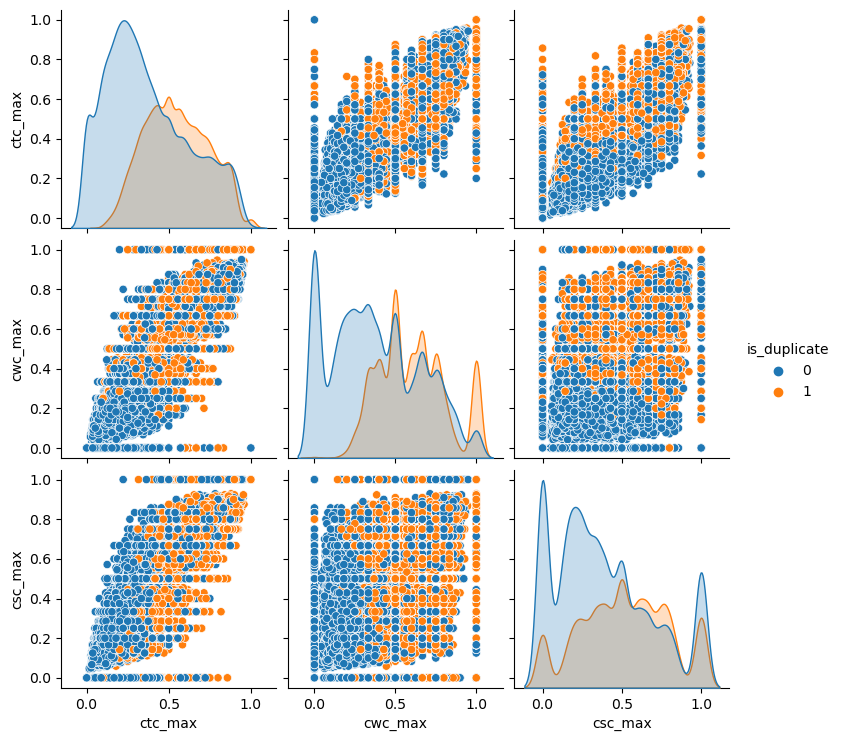

In [167]:
plt.show()

In [168]:
from sklearn.preprocessing import MinMaxScaler
X = MinMaxScaler().fit_transform(new_df[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = new_df['is_duplicate'].values

In [169]:
from sklearn.manifold import TSNE

tsne2d = TSNE(
    n_components=2,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.743s...
[t-SNE] Computed neighbors for 50000 samples in 15.116s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sa

C:\Users\AMIT PAREEK\anaconda3\lib\site-packages\seaborn\regression.py:580: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


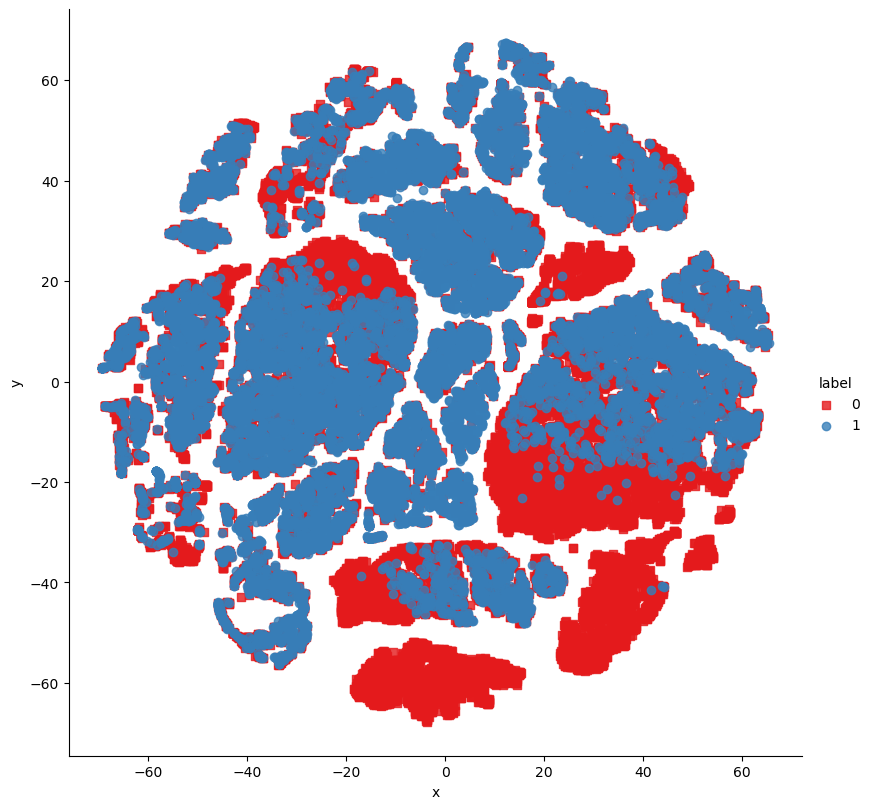

In [170]:
x_df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=x_df, x='x', y='y', hue='label', fit_reg=False, size=8,palette="Set1",markers=['s','o'])
plt.show()

In [171]:
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.742s...
[t-SNE] Computed neighbors for 50000 samples in 14.014s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sa

In [172]:
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected=True)

trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

In [174]:
ques_df=new_df[['question1','question2']]
ques_df.head()

,question1,question2
261615,what is the worst drug and why,what is the worst drug to be addicted to
266040,where do we come from,where did we come from
355341,how do i keep my boyfriend sexually satisfied,how do i satisfy my penis i at times keep on ...
300542,how may i know whether my wife is cheating on me,how do i know whether a guy is cheating on me ...
168091,what type of curve described is by the polar e...,what do you understand by term business


In [175]:
 final_df=new_df.drop(columns=["id","qid1","qid2","question1","question2"])

In [176]:
print(final_df.shape)

(50000, 25)


In [178]:
final_df.head()

,is_duplicate,q1_len,q2_len,q1_num_word,q2_num_word,word_common,word_total,word_share,q1_num_words,q2_num_words,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
261615,0,30,40,7,9,5,15,0.33,7,9,...,0.555549,0.0,1.0,2.0,8.0,0.741935,74,80,71,85
266040,1,21,22,5,5,4,10,0.40,5,5,...,0.799984,1.0,1.0,0.0,5.0,0.590909,93,90,93,93
355341,0,45,145,8,29,5,32,0.16,8,32,...,0.172413,0.0,1.0,21.0,18.5,0.195652,32,49,36,52
300542,1,48,51,11,13,8,24,0.33,11,13,...,0.615380,0.0,1.0,2.0,12.0,0.367347,79,81,75,86
168091,0,63,39,14,7,2,21,0.10,15,7,...,0.153845,0.0,1.0,6.0,10.0,0.125000,39,51,34,38


In [189]:
final_df=final_df.drop(columns=["q1_num_word","q2_num_word"])

In [190]:
final_df.head()

,is_duplicate,q1_len,q2_len,word_common,word_total,word_share,q1_num_words,q2_num_words,cwc_min,cwc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
261615,0,30,40,5,15,0.33,7,9,0.999950,0.666644,...,0.555549,0.0,1.0,2.0,8.0,0.741935,74,80,71,85
266040,1,21,22,4,10,0.40,5,5,0.999900,0.999900,...,0.799984,1.0,1.0,0.0,5.0,0.590909,93,90,93,93
355341,0,45,145,5,32,0.16,8,32,0.249994,0.076922,...,0.172413,0.0,1.0,21.0,18.5,0.195652,32,49,36,52
300542,1,48,51,8,24,0.33,11,13,0.749981,0.599988,...,0.615380,0.0,1.0,2.0,12.0,0.367347,79,81,75,86
168091,0,63,39,2,21,0.10,15,7,0.000000,0.000000,...,0.153845,0.0,1.0,6.0,10.0,0.125000,39,51,34,38


In [193]:
from sklearn.feature_extraction.text import CountVectorizer
questions=list(ques_df["question1"])+list(ques_df["question2"])

In [194]:
cv=CountVectorizer(max_features=3000)
q1_arr,q2_arr=np.vsplit(cv.fit_transform(questions).toarray(),2)

In [202]:
temp_df1=pd.DataFrame(q1_arr,index=ques_df.index)
temp_df2=pd.DataFrame(q2_arr,index=ques_df.index)
temp_df=pd.concat([temp_df1,temp_df2],axis=1)
print(temp_df.shape)

(50000, 6000)


In [204]:
temp_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2990,2991,2992,2993,2994,2995,2996,2997,2998,2999
261615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
266040,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
355341,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
300542,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
168091,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [205]:
final_df=pd.concat([final_df,temp_df],axis=1)

In [206]:
print(final_df.shape)

(50000, 6023)


In [207]:
final_df

,is_duplicate,q1_len,q2_len,word_common,word_total,word_share,q1_num_words,q2_num_words,cwc_min,cwc_max,...,2990,2991,2992,2993,2994,2995,2996,2997,2998,2999
261615,0,30,40,5,15,0.33,7,9,0.999950,0.666644,...,0,0,0,0,0,0,0,0,0,0
266040,1,21,22,4,10,0.40,5,5,0.999900,0.999900,...,0,0,0,0,0,0,0,0,0,0
355341,0,45,145,5,32,0.16,8,32,0.249994,0.076922,...,0,0,0,0,0,0,0,0,0,0
300542,1,48,51,8,24,0.33,11,13,0.749981,0.599988,...,0,0,0,0,0,0,0,0,0,0
168091,0,63,39,2,21,0.10,15,7,0.000000,0.000000,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53948,0,21,81,2,18,0.11,5,13,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
102680,0,44,39,6,17,0.35,9,8,0.666644,0.666644,...,0,0,0,0,0,0,0,0,0,0
372332,1,91,88,9,29,0.31,18,16,0.666656,0.571420,...,0,0,0,0,0,0,0,0,0,0
283616,1,88,52,10,32,0.31,21,13,0.857131,0.545450,...,0,0,0,0,0,0,0,0,0,0


In [219]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(final_df.iloc[:,1:].values,final_df.iloc[:,0].values,test_size=.2,random_state=10)

In [220]:
x_train.shape

(40000, 6022)

In [221]:
from sklearn.metrics import accuracy_score
rf=RandomForestClassifier()
rf.fit(x_train,y_train)
y_pred=rf.predict(x_test)
accuracy_score(y_test,y_pred)

0.7965

In [222]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_pred)

array([[5444,  861],
       [1174, 2521]], dtype=int64)

In [228]:
!pip install pickle4

  Created wheel for pickle4: filename=pickle4-0.0.1-py2.py3-none-any.whl size=19707 sha256=8d9c3b83837d94eb9c979d9d2d959b604e32a4e41b349ed4e72b67a33d269b6a
  Stored in directory: c:\users\amit pareek\appdata\local\pip\cache\wheels\be\be\f4\bcfb5c5279934700537e0aa84c9dc81a14392c775b107c4a5d
Successfully built pickle4


In [230]:
import pickle

pickle.dump(rf,open("model.pkl",'wb'))
pickle.dump(cv,open("cv.pkl",'wb'))